# Index

* [Strategy](#strategy)
* [Finding the best NWP variables](#best_NWP)
    - [Best velocities `U` and `V`](#u_v)
    - [Best temperature `T`](#T)
    - [Trying the best features found](#best_feat)
    - [Trying the features obtained form the average of all NWP](#average_feat)
* [Modeling](#modeling)
    - [Multivariate Adaptative Regression Splines (MARS)](#mars)
    - [K-Nearest Neighbohrs (KNN)](#knn)
    - [Suppor Vector Machines (SVM)](#svm)
    - [Xtreme Gradient Boosting (XGBoost)](#xgb)
    - [Artificial Neural Network (ANN)](#ann)
    

In [2]:
%load_ext autoreload
%autoreload 2

# Common libraries
import numpy as np
import pandas as pd
import os
import datetime as dt

from src.functions import data_import as dimp
from src.functions import data_exploration as dexp
from src.functions import data_transformation as dtr
from src.functions import metric

# Graphics
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly as pty
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
cf.set_config_file(offline=True)

import re
from collections import OrderedDict

# Save images 
DIR = "../../TFM/reports/figures/"
WF = "WF1"
IMAGES_PATH = os.path.join(DIR, WF)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

# Ignore warnings (SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")


In [2]:
# Load data
%store -r X_train_cpy
%store -r X_test_cpy
%store -r y_train
%store -r y_test

In [46]:
X_test_cpy

,Time,ID,WF,NWP1_00h_D-2_U,NWP1_00h_D-2_V,NWP1_00h_D-2_T,NWP1_06h_D-2_U,NWP1_06h_D-2_V,NWP1_06h_D-2_T,NWP1_12h_D-2_U,NWP1_12h_D-2_V,NWP1_12h_D-2_T,NWP1_18h_D-2_U,NWP1_18h_D-2_V,NWP1_18h_D-2_T,NWP1_00h_D-1_U,NWP1_00h_D-1_V,NWP1_00h_D-1_T,NWP1_06h_D-1_U,NWP1_06h_D-1_V,NWP1_06h_D-1_T,NWP1_12h_D-1_U,NWP1_12h_D-1_V,NWP1_12h_D-1_T,NWP1_18h_D-1_U,NWP1_18h_D-1_V,NWP1_18h_D-1_T,NWP1_00h_D_U,NWP1_00h_D_V,NWP1_00h_D_T,NWP1_06h_D_U,NWP1_06h_D_V,NWP1_06h_D_T,NWP1_12h_D_U,NWP1_12h_D_V,NWP1_12h_D_T,NWP1_18h_D_U,NWP1_18h_D_V,NWP1_18h_D_T,NWP2_00h_D-2_U,NWP2_00h_D-2_V,NWP2_12h_D-2_U,NWP2_12h_D-2_V,NWP2_00h_D-1_U,NWP2_00h_D-1_V,NWP2_12h_D-1_U,NWP2_12h_D-1_V,NWP2_00h_D_U,NWP2_00h_D_V,NWP2_12h_D_U,NWP2_12h_D_V,NWP3_00h_D-2_U,NWP3_00h_D-2_V,NWP3_00h_D-2_T,NWP3_06h_D-2_U,NWP3_06h_D-2_V,NWP3_06h_D-2_T,NWP3_12h_D-2_U,NWP3_12h_D-2_V,NWP3_12h_D-2_T,NWP3_18h_D-2_U,NWP3_18h_D-2_V,NWP3_18h_D-2_T,NWP3_00h_D-1_U,NWP3_00h_D-1_V,NWP3_00h_D-1_T,NWP3_06h_D-1_U,NWP3_06h_D-1_V,NWP3_06h_D-1_T,NWP3_12h_D-1_U,NWP3_12h_D-1_V,NWP3_12h_D-1_T,NWP3_18h_D-1_U,NWP3_18h_D-1_V,NWP3_18h_D-1_T,NWP3_00h_D_U,NWP3_00h_D_V,NWP3_00h_D_T,NWP3_06h_D_U,NWP3_06h_D_V,NWP3_06h_D_T,NWP3_12h_D_U,NWP3_12h_D_V,NWP3_12h_D_T,NWP3_18h_D_U,NWP3_18h_D_V,NWP3_18h_D_T,NWP4_00h_D-2_U,NWP4_00h_D-2_V,NWP4_00h_D-2_CLCT,NWP4_12h_D-2_U,NWP4_12h_D-2_V,NWP4_12h_D-2_CLCT,NWP4_00h_D-1_U,NWP4_00h_D-1_V,NWP4_00h_D-1_CLCT,NWP4_12h_D-1_U,NWP4_12h_D-1_V,NWP4_12h_D-1_CLCT,NWP4_00h_D_U,NWP4_00h_D_V,NWP4_00h_D_CLCT,NWP4_12h_D_U,NWP4_12h_D_V,NWP4_12h_D_CLCT,NWP1_U,NWP1_V,NWP1_T,NWP2_U,NWP2_V,NWP3_U,NWP3_V,NWP3_T,NWP4_U,NWP4_V,NWP4_CLCT,NWP1_wvel,NWP1_wdir,NWP1_wdir_sin,NWP1_wdir_cos,NWP1_wshear,NWP2_wvel,NWP2_wdir,NWP2_wdir_sin,NWP2_wdir_cos,NWP2_wshear,NWP3_wvel,NWP3_wdir,NWP3_wdir_sin,NWP3_wdir_cos,NWP3_wshear,NWP4_wvel,NWP4_wdir,NWP4_wdir_sin,NWP4_wdir_cos,NWP4_wshear,hour,month,hour_sin,hour_cos,month_sin,month_cos
0,2018-11-14 00:00:00,4727,WF1,-2.121094,-2.443359,287.50,-1.804688,-3.511719,287.00,-2.726562,-1.971680,288.00,-1.393555,-2.113281,287.25,-2.416016,-1.206055,287.75,-2.482422,-1.552734,288.75,-2.052734,-0.610840,288.00,-1.327148,0.075684,288.25,-0.775879,0.379883,288.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.537598,-1.308594,-1.629883,-1.940430,-1.740234,-1.346680,-1.061523,-2.558594,-0.897461,-1.253906,NaN,NaN,-0.631836,-2.357422,288.75,-0.385498,-2.701172,288.75,-1.025391,-1.590820,289.25,-1.106445,-1.272461,289.25,-1.380859,-0.865723,289.50,-0.897949,-0.958008,289.25,-0.621094,-1.817383,288.75,-0.300049,-2.281250,288.75,-0.352295,-1.959961,288.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.137573,-1.619141,55.968750,-0.589355,-1.385742,43.656250,-0.858398,-1.210938,95.062500,-0.558594,-1.636719,56.281250,-0.411865,-1.547852,69.312500,NaN,NaN,NaN,-0.775879,0.379883,-257.55,-0.897461,-1.253906,-0.352295,-1.959961,-257.550000,-0.858398,-1.210938,95.062500,0.863886,116.087115,0.898126,-0.439737,0.783993,1.541985,35.592514,0.582017,0.813177,1.399381,1.991371,10.189871,0.176911,0.984227,1.807207,1.484324,35.331721,0.578309,0.815818,1.859450,0,11,0.000000e+00,1.000000e+00,-5.000000e-01,0.866025
1,2018-11-14 01:00:00,4728,WF1,-1.703125,-0.535645,287.00,-1.742188,-2.023438,286.75,-2.023438,0.621094,287.75,-1.087891,-1.125000,287.00,-1.346680,0.587402,287.50,-2.048828,-0.392822,288.25,-1.606445,0.220581,287.50,-1.351562,-0.396973,287.75,-1.058594,-0.440430,288.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.815918,-1.104492,43.437500,-0.873047,-1.086914,81.750000,-0.671875,-1.813477,56.125000,-0.644531,-1.721680,70.000000,NaN,NaN,NaN,-1.058594,-0.440430,-258.30,-1.414062,-1.431966,-0.825358,-1.737956,-257.716667,-0.873047,-1.086914,81.750000,1.146560,67.410166,0.923278,0.384132,1.040525,2.012486,44.639572,0.702645,0.711541,1.826370,1.923982,25.403121,0.428984,0.903312,1.746050,1.394128,38.772632,0.626231,0.779637,1.7464

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Strategy
<a id="strategy"></a>

These are the steps we're going to take:
1. Find out which NWP performs the best for each weather variable (except for `CLCT` that is only provided by NWP4 provides).
    - Varaibles `U` and `V`: it implies to train models and compare them for all the four NWP, as all provide these variables.
    - Variable `T`: it implies to compare models between NWP1 and NWP3, the ones who provide tempetarue.


2. Train models with standard parameters using the best weather variables from step 1.
3. For each variable, take the mean of all the NWP.
4. Train models with the variables obtained in step 3.
5. Compare the models in order to decide which one will be the one used to re-train original X_train and predicts on original X_test, for each WF.
    
These are the algorithms to be analyzed, using standard hyper-parameters here, to be tunned in next steps:
* KNN
* SVM
* XGBoost
* ANN
* MARS 

In [83]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PowerTransformer
from sklearn.pipeline import Pipeline
from src.functions import metric
from sklearn.model_selection import cross_val_score
from sklearn.metrics.scorer import make_scorer
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
import xgboost as xgb
from pyearth import Earth
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score, median_absolute_error, mean_squared_error
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor 
np.warnings.filterwarnings('ignore')

## Finding the best NWP variables
<a id="best_NWP"></a>

### Best velocities  `U` and `V`
<a id="u_v"></a>

In [139]:
# selecting column
y_train = y_train['Production']
y_test = y_test['Production']

In [85]:
def train_models_by_nwp(nwp):
    
    r2_test_scores = []
    
    # selecting columns by nwp
    X_train = X_train_cpy[[nwp + '_wshear', nwp + '_wdir']]
    X_test = X_test_cpy[[nwp + '_wshear', nwp + '_wdir']]
    
    # scaling features 
    pt = MinMaxScaler()
    X_train_trn = pt.fit_transform(X_train)
    X_test_trn = pt.fit_transform(X_test)
    
    # KNN model
    knn_reg = KNeighborsRegressor()
    knn_reg.fit(X_train_trn, y_train)

    y_train_pred = knn_reg.predict(X_train_trn)
    y_test_pred = knn_reg.predict(X_test_trn)

    knn_mse_train = mean_squared_error(y_train, y_train_pred)
    knn_mse_test  = mean_squared_error(y_test, y_test_pred)
    knn_r2_train = r2_score(y_train, y_train_pred)
    knn_r2_test = r2_score(y_test, y_test_pred)
    
    # SVM model
    svm_reg = SVR()
    svm_reg.fit(X_train_trn, y_train)

    y_train_pred = svm_reg.predict(X_train_trn)
    y_test_pred = svm_reg.predict(X_test_trn)

    svm_mse_train = mean_squared_error(y_train, y_train_pred)
    svm_mse_test  = mean_squared_error(y_test, y_test_pred)
    svm_r2_train = r2_score(y_train, y_train_pred)
    svm_r2_test = r2_score(y_test, y_test_pred)
    
    # XGBoost model
    xgb_reg = xgb.XGBRegressor()
    xgb_reg.fit(X_train, y_train)

    y_train_pred = xgb_reg.predict(X_train)
    y_test_pred = xgb_reg.predict(X_test)

    xgb_mse_train = mean_squared_error(y_train, y_train_pred)
    xgb_mse_test  = mean_squared_error(y_test, y_test_pred)
    xgb_r2_train = r2_score(y_train, y_train_pred)
    xgb_r2_test = r2_score(y_test, y_test_pred)
    
    # MARS model
    reg = Earth()
    reg.fit(X_train, y_train)

    y_train_pred = reg.predict(X_train)
    y_test_pred = reg.predict(X_test)

    mars_mse_train = mean_squared_error(y_train, y_train_pred)
    mars_mse_test  = mean_squared_error(y_test, y_test_pred)
    mars_r2_train = r2_score(y_train, y_train_pred)
    mars_r2_test = r2_score(y_test, y_test_pred) 
    
    r2_test_scores.append(knn_r2_test)
    r2_test_scores.append(svm_r2_test)
    r2_test_scores.append(xgb_r2_test)
    r2_test_scores.append(mars_r2_test)
    
    print('Test accuracies for {}'.format(nwp))
    print('KNN:     R^2 = %.3f, MSE = %.3f' % (knn_r2_test, knn_mse_test))
    print('SVM:     R^2 = %.3f, MSE = %.3f' % (svm_r2_test, svm_mse_test))
    print('XGBoost: R^2 = %.3f, MSE = %.3f' % (xgb_r2_test, xgb_mse_test))
    print('MARS:    R^2 = %.3f, MSE = %.3f' % (mars_r2_test, mars_mse_test))
    print('Mean:    R^2 = %3f' % (np.mean(r2_test_scores)))
    print('\n')
    
    return np.mean(r2_test_scores)
    

In [86]:
test_mean_scores = {}
for nwp in ['NWP1','NWP2','NWP3','NWP4']:
    test_mean_scores[nwp] = train_models_by_nwp(nwp)

    

[21:14:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Test accuracies for NWP1
KNN:     R^2 = 0.650, MSE = 4.078
SVM:     R^2 = 0.671, MSE = 3.830
XGBoost: R^2 = 0.681, MSE = 3.719
MARS:    R^2 = 0.671, MSE = 3.826
Mean:    R^2 = 0.668282


[21:14:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Test accuracies for NWP2
KNN:     R^2 = 0.620, MSE = 4.430
SVM:     R^2 = 0.663, MSE = 3.928
XGBoost: R^2 = 0.663, MSE = 3.923
MARS:    R^2 = 0.687, MSE = 3.644
Mean:    R^2 = 0.658166


[21:14:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Test accuracies for NWP3
KNN:     R^2 = 0.601, MSE = 4.648
SVM:     R^2 = 0.595, MSE = 4.712
XGBoost: R^2 = 0.642, MSE = 4.171
MARS:    R^2 = 0.631, MSE = 4.300
Mean:    R^2 = 0.617245


[21:14:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in fa

The best NWP for variables `U` and `V` is NWP1.

### Best temperature `T`
<a id="T"></a>

Now will find with NWP, 1 or 3, provides the best forecast of `T`. We're using `U` and `V` from NWP1, as we saw they are the best forecasts among all.

In [87]:
def train_models_by_nwp(nwp):
    
    r2_test_scores = []
    
    # selecting columns by nwp
    X_train = X_train_cpy[['NWP1_wvel', 'NWP1_wdir', nwp + '_T']]
    X_test = X_test_cpy[['NWP1_wvel', 'NWP1_wdir', nwp + '_T']]
    
    # scaling features 
    pt = MinMaxScaler()
    X_train_trn = pt.fit_transform(X_train)
    X_test_trn = pt.fit_transform(X_test)
    
    # KNN model
    knn_reg = KNeighborsRegressor()
    knn_reg.fit(X_train_trn, y_train)

    y_train_pred = knn_reg.predict(X_train_trn)
    y_test_pred = knn_reg.predict(X_test_trn)

    knn_mse_train = mean_squared_error(y_train, y_train_pred)
    knn_mse_test  = mean_squared_error(y_test, y_test_pred)
    knn_r2_train = r2_score(y_train, y_train_pred)
    knn_r2_test = r2_score(y_test, y_test_pred)
    
    # SVM model
    svm_reg = SVR()
    svm_reg.fit(X_train_trn, y_train)

    y_train_pred = svm_reg.predict(X_train_trn)
    y_test_pred = svm_reg.predict(X_test_trn)

    svm_mse_train = mean_squared_error(y_train, y_train_pred)
    svm_mse_test  = mean_squared_error(y_test, y_test_pred)
    svm_r2_train = r2_score(y_train, y_train_pred)
    svm_r2_test = r2_score(y_test, y_test_pred)
    
    # XGBoost model
    xgb_reg = xgb.XGBRegressor()
    xgb_reg.fit(X_train, y_train)

    y_train_pred = xgb_reg.predict(X_train)
    y_test_pred = xgb_reg.predict(X_test)

    xgb_mse_train = mean_squared_error(y_train, y_train_pred)
    xgb_mse_test  = mean_squared_error(y_test, y_test_pred)
    xgb_r2_train = r2_score(y_train, y_train_pred)
    xgb_r2_test = r2_score(y_test, y_test_pred)
    
    # MARS model
    reg = Earth()
    reg.fit(X_train, y_train)

    y_train_pred = reg.predict(X_train)
    y_test_pred = reg.predict(X_test)

    mars_mse_train = mean_squared_error(y_train, y_train_pred)
    mars_mse_test  = mean_squared_error(y_test, y_test_pred)
    mars_r2_train = r2_score(y_train, y_train_pred)
    mars_r2_test = r2_score(y_test, y_test_pred) 
    
    r2_test_scores.append(knn_r2_test)
    r2_test_scores.append(svm_r2_test)
    r2_test_scores.append(xgb_r2_test)
    r2_test_scores.append(mars_r2_test)
    
    print('Test accuracies for {}'.format(nwp))
    print('KNN:     R^2 = %.3f, MSE = %.3f' % (knn_r2_test, knn_mse_test))
    print('SVM:     R^2 = %.3f, MSE = %.3f' % (svm_r2_test, svm_mse_test))
    print('XGBoost: R^2 = %.3f, MSE = %.3f' % (xgb_r2_test, xgb_mse_test))
    print('MARS:    R^2 = %.3f, MSE = %.3f' % (mars_r2_test, mars_mse_test))
    print('Mean:    R^2 = %3f' % (np.mean(r2_test_scores)))
    print('\n')
    
    return np.mean(r2_test_scores)
    

In [88]:
test_mean_scores = {}
for nwp in ['NWP1','NWP3']:
    test_mean_scores[nwp] = train_models_by_nwp(nwp)

[21:14:37] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Test accuracies for NWP1
KNN:     R^2 = 0.623, MSE = 4.391
SVM:     R^2 = 0.663, MSE = 3.923
XGBoost: R^2 = 0.587, MSE = 4.811
MARS:    R^2 = 0.652, MSE = 4.055
Mean:    R^2 = 0.631225


[21:14:39] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Test accuracies for NWP3
KNN:     R^2 = 0.600, MSE = 4.664
SVM:     R^2 = 0.664, MSE = 3.909
XGBoost: R^2 = 0.645, MSE = 4.129
MARS:    R^2 = 0.647, MSE = 4.112
Mean:    R^2 = 0.639100




We get a better R$^2$ using tempetature forescasts from NWP3. So, finally we'll use the following weather variables:
* NWP1_U
* NWP1_V
* NWP3_T
* NWP4_CLCT

### Trying the best features found
<a id="best_feat"></a>

In [89]:
# Making the data set from best features previously found
X_train = X_train_cpy[['NWP1_wvel', 'NWP1_wdir', 'NWP3_T', 'NWP4_CLCT']]
X_test = X_test_cpy[['NWP1_wvel', 'NWP1_wdir', 'NWP3_T', 'NWP4_CLCT']]

In [90]:
X_train.rename(columns={'NWP1_wvel': 'wind_vel', 'NWP1_wdir': 'wind_dir', 
                'NWP3_T': 'temperature', 'NWP4_CLCT': 'CLCT'}, inplace=True)

In [91]:
X_test.rename(columns={'NWP1_wvel': 'wind_vel', 'NWP1_wdir': 'wind_dir', 
                'NWP3_T': 'temperature', 'NWP4_CLCT': 'CLCT'}, inplace=True)

In [92]:
X_train.head()

,wind_vel,wind_dir,temperature,CLCT
0,3.958163,34.607537,12.850000,82.5625
1,2.830924,59.276909,12.850000,100.0000
2,4.548818,312.285273,12.850000,98.3750
3,7.239816,329.200597,12.516667,94.8750
4,6.647299,325.002463,12.183333,95.8750


In [93]:
def train_models(X_train, X_test, y_train, y_test):
    #scaling features 
    pt = MinMaxScaler()
    X_train_trn = pt.fit_transform(X_train)
    X_test_trn = pt.fit_transform(X_test)
    
    # KNN model
    knn_reg = KNeighborsRegressor()
    knn_reg.fit(X_train_trn, y_train)
    
    y_train_pred = knn_reg.predict(X_train_trn)
    y_test_pred = knn_reg.predict(X_test_trn)
    
    knn_mse_train = mean_squared_error(y_train, y_train_pred)
    knn_mse_test  = mean_squared_error(y_test, y_test_pred)
    knn_r2_train = r2_score(y_train, y_train_pred)
    knn_r2_test = r2_score(y_test, y_test_pred)
    
    # SVM model
    svm_reg = SVR()
    svm_reg.fit(X_train_trn, y_train)
    
    y_train_pred = svm_reg.predict(X_train_trn)
    y_test_pred = svm_reg.predict(X_test_trn)
    
    svm_mse_train = mean_squared_error(y_train, y_train_pred)
    svm_mse_test  = mean_squared_error(y_test, y_test_pred)
    svm_r2_train = r2_score(y_train, y_train_pred)
    svm_r2_test = r2_score(y_test, y_test_pred)
    
    # XGBoost model
    xgb_reg = xgb.XGBRegressor()
    xgb_reg.fit(X_train, y_train)
    
    y_train_pred = xgb_reg.predict(X_train)
    y_test_pred = xgb_reg.predict(X_test)
    
    xgb_mse_train = mean_squared_error(y_train, y_train_pred)
    xgb_mse_test  = mean_squared_error(y_test, y_test_pred)
    xgb_r2_train = r2_score(y_train, y_train_pred)
    xgb_r2_test = r2_score(y_test, y_test_pred)
    
    # MARS model
    reg = Earth()
    reg.fit(X_train, y_train)
    
    y_train_pred = reg.predict(X_train)
    y_test_pred = reg.predict(X_test)
    
    mars_mse_train = mean_squared_error(y_train, y_train_pred)
    mars_mse_test  = mean_squared_error(y_test, y_test_pred)
    mars_r2_train = r2_score(y_train, y_train_pred)
    mars_r2_test = r2_score(y_test, y_test_pred) 
    
    r2_test_scores = []
    r2_test_scores.append(knn_r2_test)
    r2_test_scores.append(svm_r2_test)
    r2_test_scores.append(xgb_r2_test)
    r2_test_scores.append(mars_r2_test)
    
    print('Test accuracies'.format(nwp))
    print('KNN:     R^2 = %.3f, MSE = %.3f' % (knn_r2_test, knn_mse_test))
    print('SVM:     R^2 = %.3f, MSE = %.3f' % (svm_r2_test, svm_mse_test))
    print('XGBoost: R^2 = %.3f, MSE = %.3f' % (xgb_r2_test, xgb_mse_test))
    print('MARS:    R^2 = %.3f, MSE = %.3f' % (mars_r2_test, mars_mse_test))
    print('Mean:    R^2 = %3f' % (np.mean(r2_test_scores)))
    print('\n')
    
    del X_train
    del X_test

In [94]:
train_models(X_train, X_test, y_train, y_test)

[21:14:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Test accuracies
KNN:     R^2 = 0.578, MSE = 4.914
SVM:     R^2 = 0.652, MSE = 4.052
XGBoost: R^2 = 0.647, MSE = 4.107
MARS:    R^2 = 0.647, MSE = 4.112
Mean:    R^2 = 0.631102




### Using the features obtained from the average of all NWP
<a id="average_feat"></a>

In [95]:
X_train_cpy.head()

,Time,ID,WF,NWP1_00h_D-2_U,NWP1_00h_D-2_V,NWP1_00h_D-2_T,NWP1_06h_D-2_U,NWP1_06h_D-2_V,NWP1_06h_D-2_T,NWP1_12h_D-2_U,NWP1_12h_D-2_V,NWP1_12h_D-2_T,NWP1_18h_D-2_U,NWP1_18h_D-2_V,NWP1_18h_D-2_T,NWP1_00h_D-1_U,NWP1_00h_D-1_V,NWP1_00h_D-1_T,NWP1_06h_D-1_U,NWP1_06h_D-1_V,NWP1_06h_D-1_T,NWP1_12h_D-1_U,NWP1_12h_D-1_V,NWP1_12h_D-1_T,NWP1_18h_D-1_U,NWP1_18h_D-1_V,NWP1_18h_D-1_T,NWP1_00h_D_U,NWP1_00h_D_V,NWP1_00h_D_T,NWP1_06h_D_U,NWP1_06h_D_V,NWP1_06h_D_T,NWP1_12h_D_U,NWP1_12h_D_V,NWP1_12h_D_T,NWP1_18h_D_U,NWP1_18h_D_V,NWP1_18h_D_T,NWP2_00h_D-2_U,NWP2_00h_D-2_V,NWP2_12h_D-2_U,NWP2_12h_D-2_V,NWP2_00h_D-1_U,NWP2_00h_D-1_V,NWP2_12h_D-1_U,NWP2_12h_D-1_V,NWP2_00h_D_U,NWP2_00h_D_V,NWP2_12h_D_U,NWP2_12h_D_V,NWP3_00h_D-2_U,NWP3_00h_D-2_V,NWP3_00h_D-2_T,NWP3_06h_D-2_U,NWP3_06h_D-2_V,NWP3_06h_D-2_T,NWP3_12h_D-2_U,NWP3_12h_D-2_V,NWP3_12h_D-2_T,NWP3_18h_D-2_U,NWP3_18h_D-2_V,NWP3_18h_D-2_T,NWP3_00h_D-1_U,NWP3_00h_D-1_V,NWP3_00h_D-1_T,NWP3_06h_D-1_U,NWP3_06h_D-1_V,NWP3_06h_D-1_T,NWP3_12h_D-1_U,NWP3_12h_D-1_V,NWP3_12h_D-1_T,NWP3_18h_D-1_U,NWP3_18h_D-1_V,NWP3_18h_D-1_T,NWP3_00h_D_U,NWP3_00h_D_V,NWP3_00h_D_T,NWP3_06h_D_U,NWP3_06h_D_V,NWP3_06h_D_T,NWP3_12h_D_U,NWP3_12h_D_V,NWP3_12h_D_T,NWP3_18h_D_U,NWP3_18h_D_V,NWP3_18h_D_T,NWP4_00h_D-2_U,NWP4_00h_D-2_V,NWP4_00h_D-2_CLCT,NWP4_12h_D-2_U,NWP4_12h_D-2_V,NWP4_12h_D-2_CLCT,NWP4_00h_D-1_U,NWP4_00h_D-1_V,NWP4_00h_D-1_CLCT,NWP4_12h_D-1_U,NWP4_12h_D-1_V,NWP4_12h_D-1_CLCT,NWP4_00h_D_U,NWP4_00h_D_V,NWP4_00h_D_CLCT,NWP4_12h_D_U,NWP4_12h_D_V,NWP4_12h_D_CLCT,NWP1_U,NWP1_V,NWP1_T,NWP2_U,NWP2_V,NWP3_U,NWP3_V,NWP3_T,NWP4_U,NWP4_V,NWP4_CLCT,NWP1_wvel,NWP1_wdir,NWP1_wdir_sin,NWP1_wdir_cos,NWP1_wshear,NWP2_wvel,NWP2_wdir,NWP2_wdir_sin,NWP2_wdir_cos,NWP2_wshear,NWP3_wvel,NWP3_wdir,NWP3_wdir_sin,NWP3_wdir_cos,NWP3_wshear,NWP4_wvel,NWP4_wdir,NWP4_wdir_sin,NWP4_wdir_cos,NWP4_wshear,hour,month,hour_sin,hour_cos,month_sin,month_cos
0,2018-05-01 01:00:00,1,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-2.248047,-3.257812,286.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.254883,-0.289795,82.5625,NaN,NaN,NaN,-2.248047,-3.257812,13.35,2.611328,-2.341797,-1.149414,-2.275391,12.850000,1.254883,-0.289795,82.5625,3.958163,34.607537,0.567952,0.823062,3.592109,3.507570,311.885242,-0.744484,0.667641,3.183187,2.549226,26.800633,0.450887,0.892581,2.313472,1.287910,283.003572,-0.974356,0.225012,1.613397,1,5,0.258819,0.965926,0.5,-0.866025
1,2018-05-01 02:00:00,2,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-2.433594,-1.446289,286.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.490234,-0.413330,100.0000,NaN,NaN,NaN,-2.433594,-1.446289,13.10,2.611328,-2.341797,-1.149414,-2.275391,12.850000,2.490234,-0.413330,100.0000,2.830924,59.276909,0.859646,0.510889,2.569118,3.507570,311.885242,-0.744484,0.667641,3.183187,2.549226,26.800633,0.450887,0.892581,2.313472,2.524304,279.424060,-0.986503,0.163740,3.162259,2,5,0.500000,0.866025,0.5,-0.866025
2,2018-05-01 03:00:00,3,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.365234,-3.060547,285.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.611328,-2.341797,NaN,NaN,-2.953125,-2.277344,287.0,-0.098267,1.709961,287.0,3.826172,2.892578,286.0,-1.888672,0.326172,287.0,-5.820312,2.181641,287.0,-5.816406,2.222656,287.0,-3.796875,-0.853516,287.0,-1.707031,-1.460938,286.0,-1.149414,-2.275391,286.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [96]:
X_train = X_train_cpy[['NWP1_U', 'NWP1_V', 'NWP1_T',
                      'NWP2_U','NWP2_V',
                      'NWP3_U','NWP3_V','NWP3_T',
                      'NWP4_U','NWP4_V','NWP4_CLCT']]

X_test = X_test_cpy[['NWP1_U', 'NWP1_V', 'NWP1_T',
                      'NWP2_U','NWP2_V',
                      'NWP3_U','NWP3_V','NWP3_T',
                      'NWP4_U','NWP4_V','NWP4_CLCT']]

X_train['U'] = (X_train_cpy.NWP1_U + X_train_cpy.NWP2_U + X_train_cpy.NWP3_U + X_train_cpy.NWP4_U)/4
X_train['V'] = (X_train_cpy.NWP1_V + X_train_cpy.NWP2_V + X_train_cpy.NWP3_V + X_train_cpy.NWP4_V)/4
X_train['T'] = (X_train_cpy.NWP1_T + X_train_cpy.NWP3_T)/2
X_train['CLCT'] = X_train_cpy.NWP4_CLCT

X_test['U'] = (X_test_cpy.NWP1_U + X_test_cpy.NWP2_U + X_test_cpy.NWP3_U)/3
X_test['V'] = (X_test_cpy.NWP1_V + X_test_cpy.NWP2_V + X_test_cpy.NWP3_V)/3
X_test['T'] = (X_test_cpy.NWP1_T + X_test_cpy.NWP3_T)/2
X_test['CLCT'] = X_test_cpy.NWP4_CLCT

X_train = X_train[['U','V','T','CLCT']]
X_test = X_test[['U','V','T','CLCT']]

In [97]:
X_train.head()

,U,V,T,CLCT
0,0.117188,-2.041199,13.100000,82.5625
1,0.379639,-1.619202,12.975000,100.0000
2,1.456055,-2.273193,12.725000,98.3750
3,1.763916,-3.171183,12.058333,94.8750
4,1.989990,-3.033040,11.766667,95.8750


In [98]:
pre_process = ColumnTransformer(remainder = 'passthrough',
                                transformers = [('drop_columns', 'drop', ['U','V'])
                                               ])

prepare_data_pipeline = Pipeline(steps=[
    ('attr_adder', dtr.NewFeaturesAdder(add_time_feat=False, add_cycl_feat=False, add_inv_T=False)),
    ('pre_process', pre_process)
])

In [99]:
X_train = prepare_data_pipeline.fit_transform(X_train)
X_test = prepare_data_pipeline.transform(X_test)

In [100]:
train_models(X_train, X_test, y_train, y_test)

[21:14:53] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Test accuracies
KNN:     R^2 = 0.607, MSE = 4.578
SVM:     R^2 = 0.687, MSE = 3.650
XGBoost: R^2 = 0.607, MSE = 4.577
MARS:    R^2 = 0.587, MSE = 4.807
Mean:    R^2 = 0.621954




Finally we got the best results for the following features, that are the ones we're using for finding the best algorithm for WF1:
* NWP1_U 
* NWP1_V
* NWP3_T
* NWP4_CLCT

In [101]:
# Definitive data sets
X_train = X_train_cpy[['ID','Time','NWP1_U', 'NWP1_V', 'NWP3_T', 'NWP4_CLCT']]
X_test = X_test_cpy[['ID','Time','NWP1_U', 'NWP1_V', 'NWP3_T', 'NWP4_CLCT']]

X_train.rename(columns={'NWP1_U': 'U', 'NWP1_V': 'V', 
                        'NWP3_T': 'T', 'NWP4_CLCT': 'CLCT'}, inplace=True)

X_test.rename(columns={'NWP1_U': 'U', 'NWP1_V': 'V', 
                        'NWP3_T': 'T', 'NWP4_CLCT': 'CLCT'}, inplace=True)

In [102]:
X_train.head()

,ID,Time,U,V,T,CLCT
0,1,2018-05-01 01:00:00,-2.248047,-3.257812,12.850000,82.5625
1,2,2018-05-01 02:00:00,-2.433594,-1.446289,12.850000,100.0000
2,3,2018-05-01 03:00:00,3.365234,-3.060547,12.850000,98.3750
3,4,2018-05-01 04:00:00,3.707031,-6.218750,12.516667,94.8750
4,5,2018-05-01 05:00:00,3.812500,-5.445312,12.183333,95.8750


In [136]:
X_train.to_csv('../../data/interim/for_modeling_by_WF/X_train.csv', index=False)
X_test.to_csv('../../data/interim/for_modeling_by_WF/X_test.csv', index=False)
y_train.to_csv('../../data/interim/for_modeling_by_WF/y_train.csv', index=False)
y_test.to_csv('../../data/interim/for_modeling_by_WF/test.csv', index=False)

## Modeling
<a id="modeling"></a>

In [3]:
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PowerTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from src.functions import metric
from sklearn.model_selection import cross_val_score
from sklearn.metrics.scorer import make_scorer
from sklearn.model_selection import GridSearchCV
from sklearn.externals import joblib
from sklearn.preprocessing import PolynomialFeatures
from sklearn import linear_model as lm
from pyearth import Earth
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
np.warnings.filterwarnings('ignore')
import hdbscan
import plotly.graph_objects as go

In [152]:
%store -r X_train_2
%store -r X_test_2
%store -r Y_train_2
%store -r Y_test_2

In [153]:
X_train = X_train_2.copy()
X_test = X_test_2.copy()

In [154]:
y_train = Y_train_2.copy()
y_test = Y_test_2.copy()

In [155]:
# Selecting rows by WF
X_train = X_train[X_train['WF'] == 'WF1']
X_test = X_test[X_test['WF'] == 'WF1']

# observations identifier
ID_train = X_train['ID']
ID_test = X_test['ID']

# selecting rows of y_train and y_test
y_train = y_train['Production']
y_train = y_train.loc[ID_train.values - 1]

y_test = y_test['Production']
y_test = y_test.loc[ID_test.values - 1]

In [156]:
## Input missing values #####
new_cols = ['NWP1_U','NWP1_V','NWP1_T','NWP2_U',
            'NWP2_V','NWP3_U','NWP3_V','NWP3_T',
            'NWP4_U','NWP4_V','NWP4_CLCT']
        
dtr.add_new_cols(new_cols, X_train)
dtr.add_new_cols(new_cols, X_test)

# Missing values inputation based on previous observations
cols_train = X_train_2.columns[3:]
cols_test = X_test_2.columns[3:-9]
X_train = dtr.input_missing_values(X_train, cols_train)
X_test = dtr.input_missing_values(X_test, cols_test)

In [157]:
## Missing values inputation with interpolation (missings due to the provision frequency of each NWP)

col_list = ['NWP2_U','NWP2_V','NWP3_U','NWP3_V','NWP3_T']
X_train.index = X_train['Time']

del X_train['Time']
    
for var in col_list:
    X_train[var].interpolate(
        method='time', 
        inplace=True,
        limit=2,
        limit_direction='both'
    )


X_train.reset_index(inplace=True)

X_test.index = X_test['Time']

del X_test['Time']
    
for var in col_list:
    X_test[var].interpolate(
        method='time', 
        inplace=True,
        limit=100,
        limit_direction='both'
    )

X_test.reset_index(inplace=True) 

In [158]:
# Selecting the best data for each weather feature
X_train['U'] = X_train.NWP1_U
X_train['V'] = X_train.NWP1_V
X_train['T'] = X_train.NWP3_T
X_train['CLCT'] = X_train.NWP4_CLCT

X_test['U'] = X_test.NWP1_U
X_test['V'] = X_test.NWP1_V
X_test['T'] = X_test.NWP3_T
X_test['CLCT'] = X_test.NWP4_CLCT

X_train = X_train[['ID','Time','U','V','T','CLCT']]
X_test = X_test[['ID','Time','U','V','T','CLCT']]

In [159]:
X_train.tail()

,ID,Time,U,V,T,CLCT
4721,4722,2018-11-13 19:00:00,-0.381104,-2.933594,290.166667,53.21875
4722,4723,2018-11-13 20:00:00,-1.107422,-3.335938,289.833333,50.87500
4723,4724,2018-11-13 21:00:00,-1.651367,-2.906250,289.500000,49.15625
4724,4725,2018-11-13 22:00:00,-2.185547,-1.594727,289.500000,52.59375
4725,4726,2018-11-13 23:00:00,-1.781250,0.016602,289.500000,55.15625


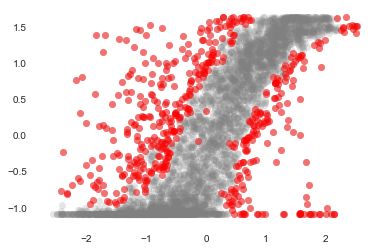

In [160]:
## Outliers and abnormal data ######

# Negative values in CLCT
X_train.loc[X_train['CLCT'] < 0, 'CLCT'] = 0.0
X_test.loc[X_test['CLCT'] < 0, 'CLCT'] = 0.0

# Locating and removing outliers based on wind power curve
# Add 'Production' column
X_train['Production'] = y_train.to_list()

# Calculate wind velocity module
X_train['vel'] = X_train.apply(dtr.get_wind_velmod, axis=1)

# Build data matrix
mm = PowerTransformer(method='yeo-johnson', standardize=True)

X1 = mm.fit_transform(X_train['vel'].values.reshape(-1,1))
X2 = mm.fit_transform(X_train['Production'].values.reshape(-1,1))
X = np.concatenate((X1,X2), axis=1)

# Using DBSCAN to find outliers
from sklearn.cluster import DBSCAN
outlier_detection = DBSCAN(
    eps = 0.1,
    metric="l1",
    min_samples = 10,
    n_jobs = -1)

clusters = outlier_detection.fit_predict(X)
outliers = np.where(clusters == -1)[0]

# Plot outliers
plt.scatter(*X.T, s=50, linewidth=0, c='gray', alpha=0.20)
plt.scatter(*X[outliers].T, s=50, linewidth=0, c='red', alpha=0.5)

# Deleting columns 'vel' and 'Production'
del X_train['vel']
del X_train['Production']

### Multiple Adaptative Regression Splines (MARS)
<a id="mars"></a>

In [161]:
## Pre-process pipeline #####
pre_process = ColumnTransformer(remainder = 'passthrough',
                                transformers = [('drop_columns', 'drop', 
                                                 ['ID','Time','U','V','CLCT','hour','month','w_dir',
                                                  'month_sin','month_cos'
                                                  ])]
)

prepare_data_pipeline = Pipeline(steps=[
    ('attr_adder', dtr.NewFeaturesAdder(add_cycl_feat=True, add_time_feat=True)), 
    ('pre_processing', pre_process),
    ('power_transf', PowerTransformer(method='yeo-johnson', standardize=True))
])

X_train_pped = prepare_data_pipeline.fit_transform(X_train)

# Deleting outlier related observations
X_train_pped = np.delete(X_train_pped, tuple(outliers), axis=0)

# Deleting the corresponding observations in y_train
y_train = np.delete(y_train.to_numpy(), list(outliers))


# make scorers
cape_scorer = make_scorer(metric.get_cape, greater_is_better=False)
r2_scorer = make_scorer(r2_score, greater_is_better=True)

## Modeling: MARS using py-earth ######
param_grid = [{'max_degree': [1,2,3], 
               'allow_linear': [False, True], 
               'penalty': [0.,1.,2.,3.,4.,5.,6.]
              }]

# Cross validation and hyper-parameter tunning with grid seach
tscv = TimeSeriesSplit(n_splits=10)
grid_search = GridSearchCV(
    Earth(feature_importance_type='gcv'), 
    param_grid, 
    cv=tscv,
    scoring=r2_scorer,
    n_jobs=-1
)

grid_search.fit(X_train_pped, y_train)

# Calculate cross validation scores
cvres = grid_search.cv_results_

# Re-training without CV, using the best param#eters obtained by CV
mars = Earth(max_degree=grid_search.best_params_['max_degree'],
             allow_linear=grid_search.best_params_['allow_linear'],
             penalty=grid_search.best_params_['penalty'],
             feature_importance_type='gcv'
            )

ttreg = TransformedTargetRegressor(regressor=mars, 
                                   transformer=PowerTransformer(method='yeo-johnson', standardize=True), 
                                   check_inverse=False)

ttreg.fit(X_train_pped, y_train)

    
# predicting on test data
X_test_pped = prepare_data_pipeline.transform(X_test)
predictions = ttreg.predict(X_test_pped)

# build prediction matrix (ID,Production)
pred_matrix = np.stack((np.array(ID_test).astype(int), predictions), axis=-1)
df_pred = pd.DataFrame(data=pred_matrix, columns=['ID','Production'])

# print score
print('Best CV score:', -grid_search_knn.best_score_)
print('Test CAPE: ', metric.get_cape(y_test, predictions))
print('Test R2: ', r2_score(y_test, predictions))
print('Test rmse: ', np.sqrt(mean_squared_error(y_test, predictions)))

Best CV score: 33.74025172114093
Test CAPE:  41.38170534453737
Test R2:  0.6617278377499172
Test rmse:  1.984877757522105


In [162]:
real_pred = np.concatenate((np.array(y_test), predictions)).reshape(1513,2)

df_real_pred =  pd.DataFrame(data=real_pred,
                             index=X_test.Time,
                             columns=['real-production','pred-production'])

df_real_pred.iplot(kind='scatter', filename='cufflinks/cf-simple-line')

### K - Nearest Neighbohrs (KNN)
<a id="knn"></a>

In [149]:
from sklearn.neighbors import KNeighborsRegressor

In [150]:
# Pre-procesado de los datos
pre_process = ColumnTransformer(remainder = 'passthrough',
                                transformers = [('drop_columns', 'drop', ['ID','Time','U','V','CLCT','T',
                                                                          'month','hour','hour_sin','month_sin',
                                                                          'month_cos','hour_cos','w_dir_cos','w_dir_sin'])]
)


# definir pipeline
prepare_data_pipeline = Pipeline(steps=[
    ('attr_adder', dtr.NewFeaturesAdder(add_time_feat=True, add_cycl_feat=True, add_inv_T=False)), 
    ('pre_processing', pre_process),
    ('power_transf', PowerTransformer(method='yeo-johnson', standardize=True))
])

# aplicar pipeline
X_train_pped = prepare_data_pipeline.fit_transform(X_train)

# Deleting outlier related observations
X_train_pped = np.delete(X_train_pped, tuple(outliers), axis=0)

# Deleting the corresponding observations in y_train
y_train = np.delete(y_train.to_numpy(), list(outliers))

# creamos nuestro scorer basado en el CAPE
cape_scorer = make_scorer(metric.get_cape, greater_is_better=False)

# Modelización KNN: implementación en GridSearchCV
param_grid = [
    {
        'n_neighbors': list(range(1,50,2)),
        'algorithm':['auto', 'kd_tree'],
        'weights': ['uniform','distance'],
        'metric': ['cityblock'],
        'p': [1,2]
    }
]

cv = TimeSeriesSplit(n_splits=7)
knn_reg = KNeighborsRegressor()
grid_search_knn = GridSearchCV(
    knn_reg, 
    param_grid, 
    cv= cv,
    n_jobs=-1,
    scoring=cape_scorer
)

grid_search_knn.fit(X_train_pped, y_train)

# Reentrenamos sin validación cruzada utilizando los mejores 
# parámetros obtenidos con la validación cruzada

knn_reg2 = KNeighborsRegressor(algorithm=grid_search_knn.best_params_['algorithm'],
                               n_neighbors=grid_search_knn.best_params_['n_neighbors'],
                               p=grid_search_knn.best_params_['p'], 
                               weights=grid_search_knn.best_params_['weights'],
                               metric=grid_search_knn.best_params_['metric'])

ttreg = TransformedTargetRegressor(regressor=knn_reg2, 
                                   transformer=PowerTransformer(method='yeo-johnson', standardize=True), 
                                   check_inverse=False)

ttreg.fit(X_train_pped, y_train)

# evaluación sobre el conjunto de test
X_test_pped = prepare_data_pipeline.transform(X_test)
predictions = ttreg.predict(X_test_pped)

# build prediction matrix (ID,Production)
pred_matrix = np.stack((np.array(ID_test).astype(int), predictions), axis=-1)
df_pred = pd.DataFrame(data=pred_matrix, columns=['ID','Production'])

print('Best CV score:', -grid_search_knn.best_score_)
print('Test CAPE: ', metric.get_cape(y_test, predictions))
print('Test R2: ', r2_score(y_test, predictions))
print('Test rmse: ', np.sqrt(mean_squared_error(y_test, predictions)))

Best CV score: 33.74025172114093
Test CAPE:  40.548780487804876
Test R2:  0.6691367422657932
Test rmse:  1.963


In [124]:
real_pred = np.concatenate((np.array(y_test), predictions)).reshape(1513,2)

df_real_pred =  pd.DataFrame(data=real_pred,
                             index=X_test.Time,
                             columns=['real-production','pred-production'])

In [126]:
df_real_pred.iplot(kind='scatter', filename='cufflinks/cf-simple-line')

0      2018-11-14 00:00:00
1      2018-11-14 01:00:00
2      2018-11-14 02:00:00
3      2018-11-14 03:00:00
4      2018-11-14 04:00:00
               ...        
1508   2019-01-15 20:00:00
1509   2019-01-15 21:00:00
1510   2019-01-15 22:00:00
1511   2019-01-15 23:00:00
1512   2019-01-16 00:00:00
Name: Time, Length: 1513, dtype: datetime64[ns]

In [86]:
predictions.shape

(1513,)